In [2]:
import pandas as pd

# Load the log data
log_data = pd.read_csv('/content/HealthApp_2k.log_structured.csv')

# Explore the dataset
log_data.head()


,LineId,Time,Component,Pid,Content,EventId,EventTemplate
0,1,20171223-22:15:29:606,Step_LSC,30002312,onStandStepChanged 3579,E42,onStandStepChanged <*>
1,2,20171223-22:15:29:615,Step_LSC,30002312,onExtend:1514038530000 14 0 4,E39,onExtend:<*> <*> <*> <*>
2,3,20171223-22:15:29:633,Step_StandReportReceiver,30002312,onReceive action: android.intent.action.SCREEN_ON,E41,onReceive action: android.intent.action.SCREEN_ON
3,4,20171223-22:15:29:635,Step_LSC,30002312,processHandleBroadcastAction action:android.in...,E43,processHandleBroadcastAction action:android.in...
4,5,20171223-22:15:29:635,Step_StandStepCounter,30002312,flush sensor data,E12,flush sensor data


In [15]:
import matplotlib.pyplot as plt

In [16]:
log_data.info()
log_data.describe()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   LineId         2000 non-null   int64 
 1   Time           2000 non-null   object
 2   Component      2000 non-null   object
 3   Pid            2000 non-null   int64 
 4   Content        2000 non-null   object
 5   EventId        2000 non-null   object
 6   EventTemplate  2000 non-null   object
dtypes: int64(2), object(5)
memory usage: 109.5+ KB


,LineId,Pid
count,2000.000000,2000.0
mean,1000.500000,30002312.0
std,577.494589,0.0
min,1.000000,30002312.0
25%,500.750000,30002312.0
50%,1000.500000,30002312.0
75%,1500.250000,30002312.0
max,2000.000000,30002312.0


In [17]:
# Check column names
print(log_data.columns)

Index(['LineId', 'Time', 'Component', 'Pid', 'Content', 'EventId',
       'EventTemplate'],
      dtype='object')


In [18]:
import pandas as pd

# Sample data
data = {'Time': ['20171223-22:15:29:606']}

# Specify the date format
date_format = "%Y%m%d-%H:%M:%S:%f"  # Adjust the format based on your data

# Convert the 'Time' column to datetime
df = pd.DataFrame(data)
df['Time'] = pd.to_datetime(df['Time'], format=date_format)

# Display the DataFrame
print(df)


                     Time
0 2017-12-23 22:15:29.606


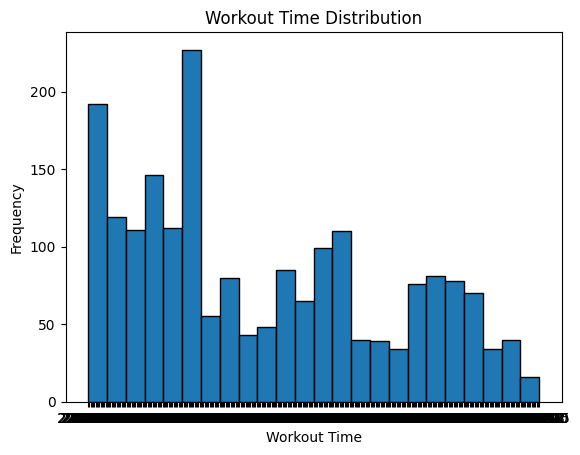

In [21]:
# Load CSV data into a DataFrame
df = pd.read_csv('/content/HealthApp_2k.log_structured.csv')

# 1. Workout Time Analysis
df['Time'] = pd.to_datetime(df['Time'], format='%Y%m%d-%H:%M:%S:%f')
df['WorkoutTime'] = df['Time'].dt.strftime('%H:%M:%S')
plt.hist(df['WorkoutTime'], bins=24, edgecolor='black')
plt.xlabel('Workout Time')
plt.ylabel('Frequency')
plt.title('Workout Time Distribution')
plt.show()

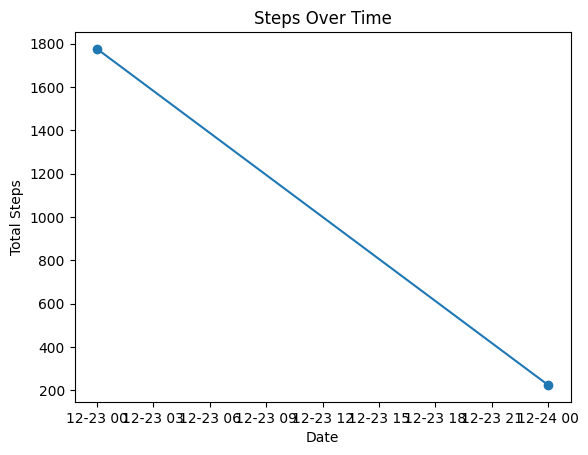

In [28]:
# Load CSV data into a DataFrame
df = pd.read_csv('/content/HealthApp_2k.log_structured.csv')  # Replace 'your_data.csv' with your actual CSV file path

# Convert 'Time' column to datetime format
df['Time'] = pd.to_datetime(df['Time'], format='%Y%m%d-%H:%M:%S:%f')

# 2. Steps Analysis
total_steps_per_day = df.groupby(df['Time'].dt.date)['LineId'].count()
plt.plot(total_steps_per_day.index, total_steps_per_day.values, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Steps')
plt.title('Steps Over Time')
plt.show()

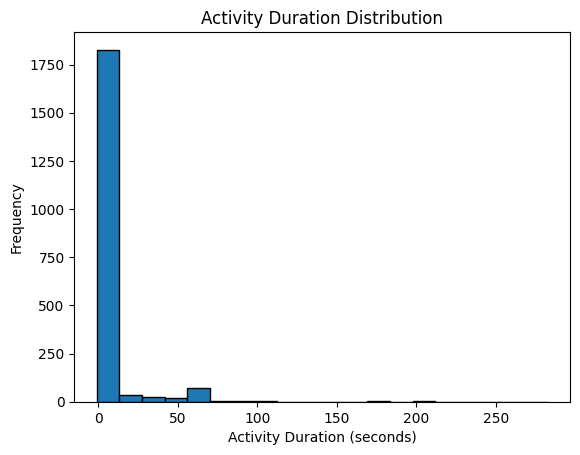

In [29]:
# 3. Activity Duration
df['ActivityDuration'] = df['Time'].diff().dt.total_seconds()
plt.hist(df['ActivityDuration'], bins=20, edgecolor='black')
plt.xlabel('Activity Duration (seconds)')
plt.ylabel('Frequency')
plt.title('Activity Duration Distribution')
plt.show()

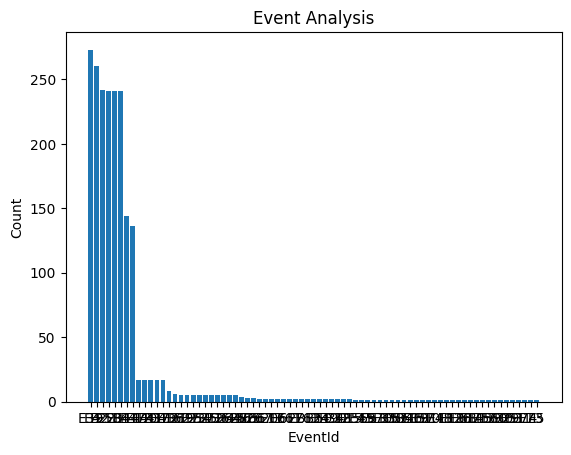

In [37]:
# Load CSV data into a DataFrame
df = pd.read_csv('/content/HealthApp_2k.log_structured.csv')  # Replace 'your_data.csv' with your actual CSV file path

# Convert 'Time' column to datetime format
df['Time'] = pd.to_datetime(df['Time'], format='%Y%m%d-%H:%M:%S:%f')

# 3. Event Analysis
events_count = df['EventId'].value_counts()

plt.bar(events_count.index, events_count.values)
plt.xlabel('EventId')
plt.ylabel('Count')
plt.title('Event Analysis')
plt.show()


In [38]:
# Load CSV data into a DataFrame
df = pd.read_csv('/content/HealthApp_2k.log_structured.csv')  # Replace 'your_data.csv' with your actual CSV file path

# Convert 'Time' column to datetime format
df['Time'] = pd.to_datetime(df['Time'], format='%Y%m%d-%H:%M:%S:%f')

# 5. Component Analysis
unique_components = df['Component'].unique()
print("Unique Components:", unique_components)

# Now, you can analyze the data based on the unique components


Unique Components: ['Step_LSC' 'Step_StandReportReceiver' 'Step_StandStepCounter'
 'Step_SPUtils' 'Step_ExtSDM' 'Step_ScreenUtil'
 'Step_FlushableStepDataCache' 'HiH_HiAppUtil' 'HiH_HiHealthBinder'
 'HiH_HiHealthDataInsertStore' 'HiH_DataStatManager' 'HiH_ListenerManager'
 'HiH_HiSyncControl' 'HiH_HiSyncUtil' 'HiH_' 'HiH_HiBroadcastUtil'
 'Step_StandStepDataManager' 'Step_DataCache' 'Step_HGNH'
 'Step_NotificationUtil']


In [42]:
# Load CSV data into a DataFrame
df = pd.read_csv('/content/HealthApp_2k.log_structured.csv')  # Replace 'your_data.csv' with your actual CSV file path

# Convert 'Time' column to datetime format
df['Time'] = pd.to_datetime(df['Time'], format='%Y%m%d-%H:%M:%S:%f')

# 6. Error Analysis
error_counts = df[df['EventTemplate'].str.startswith('E')]['EventTemplate'].value_counts()

# Check if there are errors in the data
if not error_counts.empty:
    error_counts.plot(kind='bar')
    plt.xlabel('Error Event')
    plt.ylabel('Frequency')
    plt.title('Error Analysis')
    plt.show()
else:
    print('No error events found in the data.')


No error events found in the data.


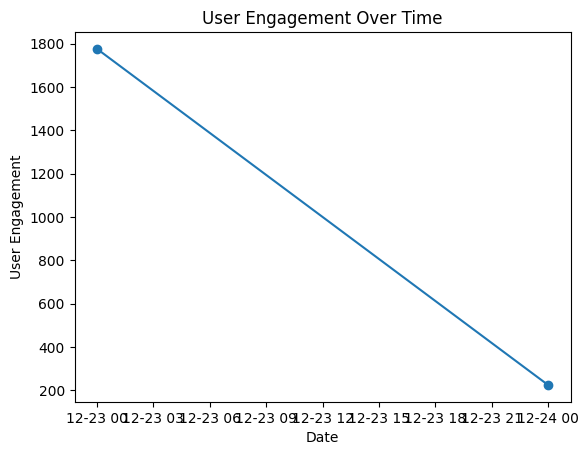

In [44]:
# Load CSV data into a DataFrame
df = pd.read_csv('/content/HealthApp_2k.log_structured.csv')  # Replace 'your_data.csv' with your actual CSV file path

# Convert 'Time' column to datetime format
df['Time'] = pd.to_datetime(df['Time'], format='%Y%m%d-%H:%M:%S:%f')

# 7. User Engagement
user_engagement = df.groupby(df['Time'].dt.date)['LineId'].count()
user_engagement.plot(marker='o')
plt.xlabel('Date')
plt.ylabel('User Engagement')
plt.title('User Engagement Over Time')
plt.show()

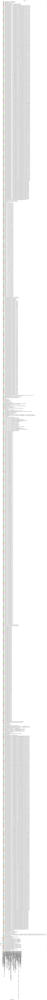

In [47]:
# Load CSV data into a DataFrame
df = pd.read_csv('/content/HealthApp_2k.log_structured.csv')  # Replace 'your_data.csv' with your actual CSV file path

# Convert 'Time' column to datetime format
df['Time'] = pd.to_datetime(df['Time'], format='%Y%m%d-%H:%M:%S:%f')

# 8. Content Analysis
# Aggregate counts for each unique combination of 'EventTemplate' and 'Content'
content_counts = df.groupby(['EventTemplate', 'Content']).size().unstack(fill_value=0)

# Plot the stacked bar chart
content_counts.plot(kind='bar', stacked=True)
plt.xlabel('Event Template')
plt.ylabel('Frequency')
plt.title('Content Analysis by Event Template')
plt.show()


In [53]:
import dash
import dash_core_components as dcc
import dash_html_components as html
import plotly.express as px
import pandas as pd
# Load CSV data into a DataFrame
df = pd.read_csv('/content/HealthApp_2k.log_structured.csv')


In [54]:
# Initialize the Dash app
app = dash.Dash(__name__)

# Define the layout of the dashboard with a Dropdown component
app.layout = html.Div([
    dcc.Dropdown(
        id='dropdown',
        options=[
            {'label': 'Option 1', 'value': 'opt1'},
            {'label': 'Option 2', 'value': 'opt2'},
            # Add more options as needed
        ],
        value='opt1',  # Default selected value
    ),
    dcc.Graph(
        id='line-chart',
        figure=px.line(df, x='Time', y='LineId', title='LineId over Time')
    ),
    dcc.Graph(
        id='bar-chart',
        figure=px.bar(df, x='EventTemplate', y='LineId', title='LineId by EventTemplate')
    ),
])

In [55]:
@app.callback(
    Output('line-chart', 'figure'),
    [Input('dropdown', 'value')]  # Example: Dropdown for selecting data
)
def update_chart(selected_value):
    # Perform data filtering or transformations based on user input
    filtered_data = df[df['Category'] == selected_value]

    # Create an interactive plot using Plotly
    fig = px.line(filtered_data, x='Date', y='Sales', title='Sales Over Time')

    return fig


In [56]:
if __name__ == '__main__':
    app.run_server(debug=True)


<IPython.core.display.Javascript object>

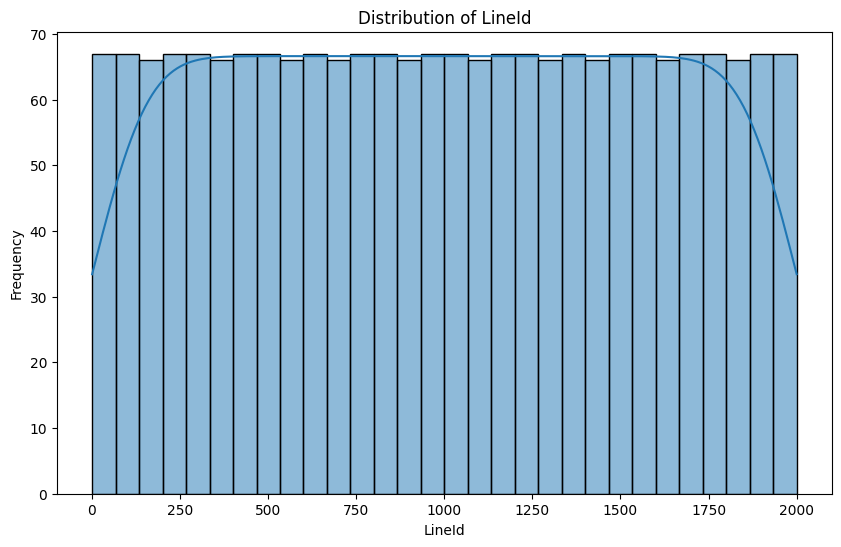

In [64]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load CSV data into a DataFrame
df = pd.read_csv('/content/HealthApp_2k.log_structured.csv')

# Display basic statistics of numerical columns
summary_stats = df.describe()

# Display the first few rows of the DataFrame
sample_data = df.head()

# Plot distribution of a numerical column (e.g., LineId)
plt.figure(figsize=(10, 6))
sns.histplot(df['LineId'], bins=30, kde=True)
plt.title('Distribution of LineId')
plt.xlabel('LineId')
plt.ylabel('Frequency')
plt.show()

# Save the summary report to a Markdown file
summary_report = f"""
# Summary Report

## Basic Statistics:
{summary_stats}

## Sample Data:
{sample_data}

## Distribution of LineId:
![Distribution of LineId](distribution_plot.png)
"""

with open('summary_report.md', 'w') as f:
    f.write(summary_report)
